# Land Cover Animations

Let's make pretty animations of landcover!



* [**Sign up to the DEA Sandbox**](https://docs.dea.ga.gov.au/setup/sandbox.html) to run this notebook interactively from a browser
* **Compatibility:** Notebook currently compatible with both the `NCI` and `DEA Sandbox` environments
* **Products used:** 
[s2a_ard_granule](https://explorer.sandbox.dea.ga.gov.au/s2a_ard_granule), 
[s2b_ard_granule](https://explorer.sandbox.dea.ga.gov.au/s2b_ard_granule),
[ga_ls5t_ard_3](https://explorer.sandbox.dea.ga.gov.au/ga_ls5t_ard_3),
[ga_ls7e_ard_3](https://explorer.sandbox.dea.ga.gov.au/ga_ls7e_ard_3),
[ga_ls8c_ard_3](https://explorer.sandbox.dea.ga.gov.au/ga_ls8c_ard_3)
* **Special requirements:** An _optional_ description of any special requirements, e.g. If running on the [NCI](https://nci.org.au/), ensure that `module load otps` is run prior to launching this notebook
* **Prerequisites:** An _optional_ list of any notebooks that should be run or content that should be understood prior to launching this notebook


### Load Modules

In [19]:
%matplotlib inline

import math
import sys

import datacube
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

sys.path.insert(1, "../Tools/")
from dea_tools.plotting import display_map
from draft_plot_land_cover import lc_animation, lc_colours, plot_land_cover

In [20]:
dc = datacube.Datacube()

## Select Area of Interest

In [21]:
# Set up a region to load data

# lake George
# point_x, point_y = (-35.1064, 149.4248)

# canberra
# point_x, point_y = (-35.2069, 149.1029)

# lat = (point_x-0.06, point_x+0.06)
# lon = (point_y-0.1, point_y+0.1)

# lake Wallawalla
point_x, point_y = (-28.7448, 147.9323)

# big desert
# point_x, point_y = (-35.5725, 141.3295)

lat = (point_x - 0.1, point_x + 0.2)
lon = (point_y - 0.3, point_y + 0.2)

# display area on map
display_map(x=lon, y=lat)

In [22]:
query = {
    "y": lat,
    "x": lon,
    "time": ("1988", "2021"),
}

# Load DEA Land Cover data from the datacube
all_data = dc.load(
    product="ga_ls_landcover_class_cyear_2",
    #              crs = "EPSG:3577",
    output_crs="EPSG:3577",
    measurements=["level3"],
    resolution=(-25, 25),
    **query
)

In [23]:
all_data

<xarray.Dataset>
Dimensions:      (time: 33, y: 1576, x: 2084)
Coordinates:
  * time         (time) datetime64[ns] 1988-01-01 1989-01-01 ... 2020-01-01
  * y            (y) float64 -3.192e+06 -3.193e+06 ... -3.232e+06 -3.232e+06
  * x            (x) float64 1.504e+06 1.504e+06 ... 1.556e+06 1.556e+06
    spatial_ref  int32 3577
Data variables:
    level3       (time, y, x) uint8 112 112 112 112 112 ... 112 112 112 112 112
Attributes:
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

In [24]:
# pull out the layer you're interested in
ds = all_data.level3

## Land Cover Animation

The lc_animation module creates an aminated time series of land cover data with or with out a coordinated stacked plot which shows the proportions of the land cover classes presant in each frame f the animation. The lc_animation module has a number of options for formating the colour and layout of the animation. The imput Land_cover_layer specifies which colour schmeme from lc_colours will be used to plot the animation. Valid options include the measurment names of the land cover layers.

lc animation saves the animation to file as a .gif. Provide an alternative file_name value or the animation will be savled as 'default_animation.gif'. 

In [25]:
### plot Animation

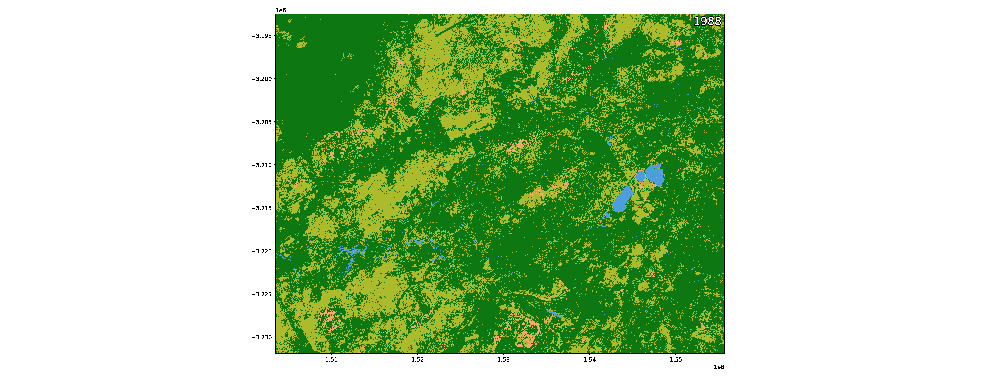

In [26]:
file_name = "test_animation.gif"

lc_animation(ds, layer="level3", file_name=file_name, stacked_plot=False, dpi=200)